In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from astropy.table import Table
from astropy.io import fits
import seaborn as sns
from matplotlib.animation import PillowWriter
import matplotlib as mpl
from matplotlib.ticker import FormatStrFormatter
from matplotlib.colors import TwoSlopeNorm
import matplotlib.colors as mcolors
import random
import matplotlib.cm as cm
import matplotlib.lines as mlines

params = {
   'axes.labelsize': 20,
   'font.size': 15,
   'legend.fontsize': 14,
   'xtick.minor.visible': True,
   'ytick.minor.visible': True,
   'xtick.labelsize': 15,
   'ytick.labelsize': 15,
   'text.usetex': True, #to use TeX in your labels
   'font.family':'serif',
   'axes.titlesize': 20,
   'xtick.direction': 'in',
   'ytick.direction': 'in',
   'xtick.top': True,
   'ytick.right': True,
   'xtick.major.size': 6,
   'xtick.minor.size': 3,
   'ytick.major.size': 6,
   'ytick.minor.size': 3
   }
rcParams.update(params)

import pandas as pd
from astropy.io import fits
from astropy.table import Table

def decode(df):
    """
    Decode DataFrame with byte strings into ordinary strings.
    """
    str_df = df.select_dtypes([object])
    str_df = str_df.stack().str.decode('utf-8').unstack()
    for col in str_df:
        df[col] = str_df[col]
    return df

def fitsrec_to_pandas(fits_rec):
    """
    Convert a FITS_rec object (from astropy.io.fits) to a pandas DataFrame.
    """
    # Convert FITS_rec to astropy Table first
    table = Table(fits_rec)
    
    # Filter out multidimensional columns
    cols = [name for name in table.colnames if len(table[name].shape) <= 1]
    
    # Convert to pandas DataFrame
    df = table[cols].to_pandas()
    
    # Decode byte strings
    df = decode(df)
    
    return df

In [2]:
with fits.open('../../data/astroNN_2proc_crossmatch.fits') as hdul:
    astronn_data = hdul[1].data
    twoprocess_data = hdul[2].data

two_process_data = fitsrec_to_pandas(twoprocess_data)
data_astronn = fitsrec_to_pandas(astronn_data)

# Identify columns that are NOT already in two_process_data
#new_cols = data_astronn.columns.difference(two_process_data.columns)
new_cols = ['galr', 'galz']

# Concatenate, keeping two_process_data's versions of duplicate columns
data = pd.concat(
    [
        two_process_data.reset_index(drop=True),
        data_astronn[new_cols].reset_index(drop=True)
    ],
    axis=1
)

data = data[data['DFLAG'] == 0]

data['MG_H'] = data['MG_H_ASPCAP_ADJ']
data['FE_H'] = data['FE_H_ASPCAP_ADJ']
data['MN_H'] = data['MN_H_ASPCAP_ADJ']
data['NI_H'] = data['NI_H_ASPCAP_ADJ']
data['AL_H'] = data['AL_H_ASPCAP_ADJ']

data['MN_O'] = data['MN_H_ASPCAP_ADJ'] - data['O_H_ASPCAP_ADJ']
data['FE_O'] = data['FE_H_ASPCAP_ADJ'] - data['O_H_ASPCAP_ADJ']
data['MN_MG'] = data['MN_H_ASPCAP_ADJ'] - data['MG_H_ASPCAP_ADJ']
data['FE_MG'] = data['FE_H_ASPCAP_ADJ'] - data['MG_H_ASPCAP_ADJ']
data['MG_FE'] = data['MG_H_ASPCAP_ADJ'] - data['FE_H_ASPCAP_ADJ']
data['MN_FE'] = data['MN_H_ASPCAP_ADJ'] - data['FE_H_ASPCAP_ADJ']
data['NI_MG'] = data['NI_H_ASPCAP_ADJ'] - data['MG_H_ASPCAP_ADJ']
data['NI_FE'] = data['NI_H_ASPCAP_ADJ'] - data['FE_H_ASPCAP_ADJ']
data['AL_MG'] = data['AL_H_ASPCAP_ADJ'] - data['MG_H_ASPCAP_ADJ']
data['AL_FE'] = data['AL_H_ASPCAP_ADJ'] - data['FE_H_ASPCAP_ADJ']

data = data[(data['galz'] < 2) & (data['galz'] > -2) & (data['galr'] < 15) & (data['galr'] > 3)]

pos_FE_H = data[(data['FE_H'] > 0)]
neg_FE_H = data[(data['FE_H'] < 0)]
data_high_alpha = pd.concat([pos_FE_H[(pos_FE_H['MG_FE'] > 0.12)], neg_FE_H[neg_FE_H['MG_FE'] > 0.12 - 0.13 * neg_FE_H['FE_H']]])
data_low_alpha = pd.concat([pos_FE_H[(pos_FE_H['MG_FE'] < 0.12)], neg_FE_H[neg_FE_H['MG_FE'] < 0.12 - 0.13 * neg_FE_H['FE_H']]])


data_high_alpha['high_low_alpha'] = "high"
data_low_alpha['high_low_alpha'] = "low"
data_high_alpha['color'] = "hotpink"
data_low_alpha['color'] = "cornflowerblue"

data = pd.concat([data_high_alpha, data_low_alpha], ignore_index=True)

#data = data[data['LOGG'] > 1.4]

# 1. Making the galaxies

In [3]:
from chemevo import evolution_V1 as evo

mg_h_big_bin_edges = np.arange(-0.7, 0.50, 0.20) 
mg_h_big_bin_centers = 0.5 * (mg_h_big_bin_edges[:-1] + mg_h_big_bin_edges[1:])

data['MG_H_big_bin'] = pd.cut(data['MG_H'], bins = mg_h_big_bin_edges, right=False, labels=False)
    
t_array = np.linspace(0.0001,14,int(1e3))
t_array_trunc = np.linspace(0.0001,6,int(1e3))
dt = t_array[1] - t_array[0]

In [9]:
gcc_Mn_def = 0.40
gcc_ratio_def = 2
alpha_cc_def = 0.60
alpha_ia_def = 0.30
ups_def = 1

In [5]:
# SFRs

def rise_fall(t, tau_1, tau_2):
    return 1 * (1 - np.exp(-t/tau_1)) * np.exp(-t/tau_2)

m_g_array_const = np.ones(len(t_array))
tau_sfh = 6 #Gyrs
m_g_array_exp = 1 * np.exp(-t_array/tau_sfh)
m_g_array_exp /= np.trapezoid(m_g_array_exp, t_array)

m_g_array_rise_fall_1 = rise_fall(t_array, 2, 8)
m_g_array_rise_fall_1 /= np.trapezoid(m_g_array_rise_fall_1, t_array)

m_g_array_rise_fall_2 = rise_fall(t_array, 4, 30)
m_g_array_rise_fall_2 /= np.trapezoid(m_g_array_rise_fall_2, t_array)

m_g_array_rise_fall_3 = rise_fall(t_array, 6, 12)
m_g_array_rise_fall_3 /= np.trapezoid(m_g_array_rise_fall_3, t_array)

sfrs = [m_g_array_const, m_g_array_exp, m_g_array_rise_fall_1, m_g_array_rise_fall_2, m_g_array_rise_fall_3]
#sfrs = [m_g_array_rise_fall_1]

In [7]:
etas = np.logspace(-2, 1, 10)
tau_stars = np.linspace(0.5, 6, 10)

ups = [0.5, 1, 2, 3]
gals_list_0 = []
gals_list_1 = []
gals_list_2 = []
gals_list_3 = []

n_gals = len(etas) * len(tau_stars) * len(sfrs)
print("n_gals in each alpha cc = ", n_gals)

n_gals in each alpha cc =  500


In [8]:
import itertools
import random

all_params = list(itertools.product(etas, tau_stars, sfrs))

random.seed(42)
sampled_params = random.sample(all_params, 100)

In [10]:
# 3. Define a function that only iterates over the 100 sampled parameters
def get_sampled_gals(params, alpha_cc=alpha_cc_def, alpha_Ia=alpha_ia_def, g_ratio=gcc_ratio_def, gcc=gcc_Mn_def, ups = ups_def):
    gals_list = []
    for eta, tau_star, sfr in params:
        gals_list.append(evo.Galaxy(
            t_array=t_array, m_g_array=sfr, tau_star=tau_star,
            eta=eta, Upsilon=ups, yields_ref="W2024,moreFe",
            g_cc_Mn=gcc, g_ratio_Mn=g_ratio,
            alpha_cc_Mn=alpha_cc, alpha_Ia_Mn=alpha_Ia
        ))
    return gals_list

# 4. Generate your 4 lists (each will have 100 galaxies with matching parameters)
gals_list_0 = get_sampled_gals(sampled_params, ups=ups[0])
gals_list_1 = get_sampled_gals(sampled_params, ups=ups[1])
gals_list_2 = get_sampled_gals(sampled_params, ups=ups[2])
gals_list_3 = get_sampled_gals(sampled_params, ups=ups[3])

# 2. Find line crossing the data

In [11]:
from scipy.stats import linregress

n_bins = 5

slopes_mn_fe, intercepts_mn_fe = np.zeros(n_bins), np.zeros(n_bins)
slopes_mn_mg, intercepts_mn_mg = np.zeros(n_bins), np.zeros(n_bins)

for i in range(n_bins):
    subset = data[data['MG_H_big_bin'] == i]
    x = subset['FE_MG']
    
    # Loop through both y-variables to save space
    for y_col, slopes, intercepts in [
        ('MN_FE', slopes_mn_fe, intercepts_mn_fe), 
        ('MN_MG', slopes_mn_mg, intercepts_mn_mg)
    ]:
        y = subset[y_col]
        mask = np.isfinite(x) & np.isfinite(y)
        
        if mask.sum() > 2:
            slope, intercept, *_ = linregress(x[mask], y[mask])
            slopes[i] = slope
            intercepts[i] = intercept

# 3. Plotting functions

In [12]:
def downsample(df, N):
    if len(df) > N:
        return df.sample(N, random_state=42)   # random subset of N
    else:
        return df
    
def find_endpoints(galaxies, bin_centers):
    endpoints_gals = []
    for bin_cent in bin_centers:
        endpoints = []
        for gal in galaxies:
            mg_h = gal.Mg_H
            crossed = False
            for indx in range(len(mg_h)):
                mg_h_at_time = mg_h[indx]
                if mg_h_at_time > bin_cent:
                    endpoints.append(indx)
                    crossed = True
                    break
            if not crossed:
                endpoints.append(-1) # Critical fix to maintain 1:1 mapping with galaxies
        endpoints_gals.append(np.array(endpoints))
    return endpoints_gals

fe_mg_bin_edges = np.arange(-0.35, 0.15, 0.1)
fe_mg_bin_centers = 0.5 * (fe_mg_bin_edges[:-1] + fe_mg_bin_edges[1:])

def compute_ratios(gals_list, endpoints, element='Fe'):
    """Calculates arrays and the max plot value for a specific element ratio."""
    all_ratios, scatter_maxes = [], []
    for k, gal in enumerate(gals_list):
        if element == 'Fe':
            ratio = gal.compute_z_Fe_Ia() / gal.compute_z_Fe_CC()
        elif element == 'X':
            ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()
        
        all_ratios.append(ratio)
        for i in range(len(endpoints)):
            if endpoints[i][k] != -1:
                scatter_maxes.append(ratio[endpoints[i][k]])
                
    return all_ratios, (max(scatter_maxes))

# A) Spaghetti plots

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


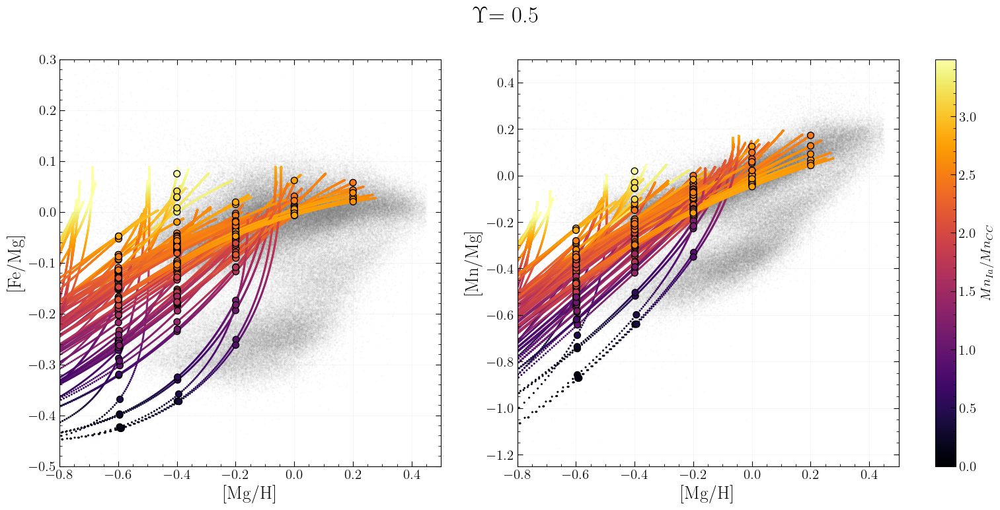

In [13]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

gals_list = gals_list_0
ups_this_plot = gals_list[0].Upsilon

# 1. Pre-calculate endpoints and ratios
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)

# Compute ONLY Mn ratios (assuming X='Mn')
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# Setup Colormap and Normalizations based on the ratio ranges
cmap = plt.get_cmap('inferno')
mn_norm = mcolors.Normalize(vmin=0, vmax=mn_max)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))

# --- Panel 1: [Fe/Mg] ---
ax1.scatter(data['MG_H'], data['FE_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax1.scatter(gal.Mg_H, gal.Fe_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    # Extract valid endpoints
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax1.scatter(gal.Mg_H[valid_idxs], gal.Fe_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax1.set_xlim(-0.8, 0.5)
ax1.set_ylim(-0.5, 0.3)
ax1.set_xlabel('[Mg/H]')
ax1.set_ylabel('[Fe/Mg]')
ax1.grid(True, alpha=0.1)

# --- Panel 2: [Mn/Mg] ---
ax2.scatter(data['MG_H'], data['MN_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax2.scatter(gal.Mg_H, gal.Mn_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax2.scatter(gal.Mg_H[valid_idxs], gal.Mn_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax2.set_xlim(-0.8, 0.5)
ax2.set_ylim(-1.25, 0.5)
ax2.set_xlabel('[Mg/H]')
ax2.set_ylabel('[Mn/Mg]')
ax2.grid(True, alpha=0.1)

# Add a single shared Mn colorbar
sm_mn = cm.ScalarMappable(cmap=cmap, norm=mn_norm)
sm_mn.set_array([]) 
cbar = fig.colorbar(sm_mn, ax=[ax1, ax2], fraction=0.05, pad=0.04)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=15)

plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


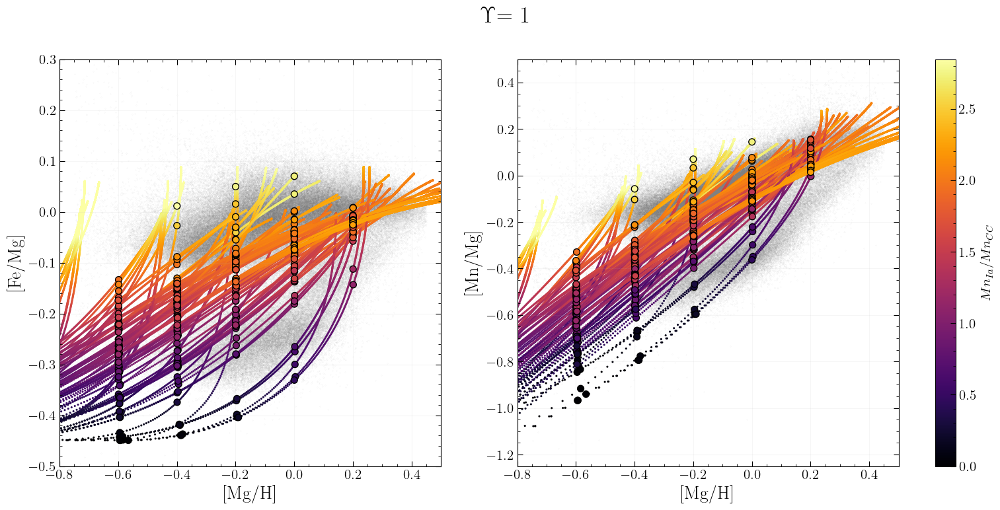

In [14]:
gals_list = gals_list_1
ups_this_plot = gals_list[1].Upsilon

# 1. Pre-calculate endpoints and ratios
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)

# Compute ONLY Mn ratios (assuming X='Mn')
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# Setup Colormap and Normalizations based on the ratio ranges
cmap = plt.get_cmap('inferno')
mn_norm = mcolors.Normalize(vmin=0, vmax=mn_max)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))

# --- Panel 1: [Fe/Mg] ---
ax1.scatter(data['MG_H'], data['FE_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax1.scatter(gal.Mg_H, gal.Fe_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    # Extract valid endpoints
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax1.scatter(gal.Mg_H[valid_idxs], gal.Fe_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax1.set_xlim(-0.8, 0.5)
ax1.set_ylim(-0.5, 0.3)
ax1.set_xlabel('[Mg/H]')
ax1.set_ylabel('[Fe/Mg]')
ax1.grid(True, alpha=0.1)

# --- Panel 2: [Mn/Mg] ---
ax2.scatter(data['MG_H'], data['MN_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax2.scatter(gal.Mg_H, gal.Mn_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax2.scatter(gal.Mg_H[valid_idxs], gal.Mn_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax2.set_xlim(-0.8, 0.5)
ax2.set_ylim(-1.25, 0.5)
ax2.set_xlabel('[Mg/H]')
ax2.set_ylabel('[Mn/Mg]')
ax2.grid(True, alpha=0.1)

# Add a single shared Mn colorbar
sm_mn = cm.ScalarMappable(cmap=cmap, norm=mn_norm)
sm_mn.set_array([]) 
cbar = fig.colorbar(sm_mn, ax=[ax1, ax2], fraction=0.05, pad=0.04)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=15)

plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


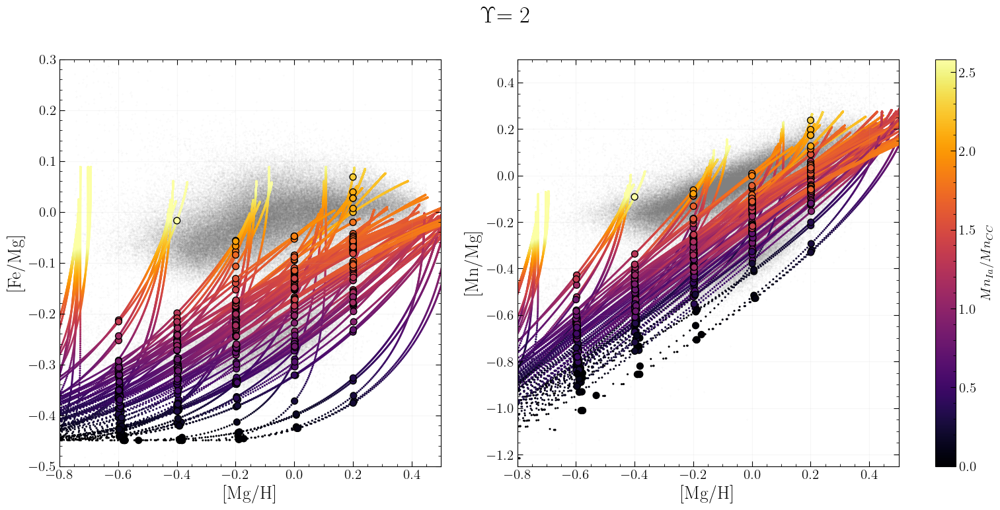

In [15]:
gals_list = gals_list_2
ups_this_plot = gals_list[2].Upsilon

# 1. Pre-calculate endpoints and ratios
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)

# Compute ONLY Mn ratios (assuming X='Mn')
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# Setup Colormap and Normalizations based on the ratio ranges
cmap = plt.get_cmap('inferno')
mn_norm = mcolors.Normalize(vmin=0, vmax=mn_max)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))

# --- Panel 1: [Fe/Mg] ---
ax1.scatter(data['MG_H'], data['FE_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax1.scatter(gal.Mg_H, gal.Fe_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    # Extract valid endpoints
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax1.scatter(gal.Mg_H[valid_idxs], gal.Fe_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax1.set_xlim(-0.8, 0.5)
ax1.set_ylim(-0.5, 0.3)
ax1.set_xlabel('[Mg/H]')
ax1.set_ylabel('[Fe/Mg]')
ax1.grid(True, alpha=0.1)

# --- Panel 2: [Mn/Mg] ---
ax2.scatter(data['MG_H'], data['MN_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax2.scatter(gal.Mg_H, gal.Mn_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax2.scatter(gal.Mg_H[valid_idxs], gal.Mn_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax2.set_xlim(-0.8, 0.5)
ax2.set_ylim(-1.25, 0.5)
ax2.set_xlabel('[Mg/H]')
ax2.set_ylabel('[Mn/Mg]')
ax2.grid(True, alpha=0.1)

# Add a single shared Mn colorbar
sm_mn = cm.ScalarMappable(cmap=cmap, norm=mn_norm)
sm_mn.set_array([]) 
cbar = fig.colorbar(sm_mn, ax=[ax1, ax2], fraction=0.05, pad=0.04)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=15)

plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


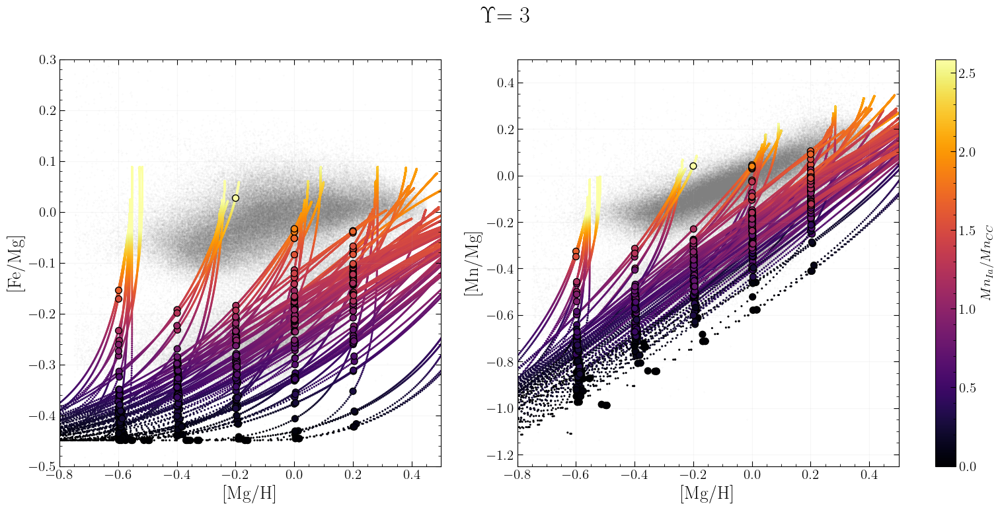

In [16]:
gals_list = gals_list_3
ups_this_plot = gals_list[3].Upsilon

# 1. Pre-calculate endpoints and ratios
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)

# Compute ONLY Mn ratios (assuming X='Mn')
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# Setup Colormap and Normalizations based on the ratio ranges
cmap = plt.get_cmap('inferno')
mn_norm = mcolors.Normalize(vmin=0, vmax=mn_max)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,8))

# --- Panel 1: [Fe/Mg] ---
ax1.scatter(data['MG_H'], data['FE_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax1.scatter(gal.Mg_H, gal.Fe_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    # Extract valid endpoints
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax1.scatter(gal.Mg_H[valid_idxs], gal.Fe_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax1.set_xlim(-0.8, 0.5)
ax1.set_ylim(-0.5, 0.3)
ax1.set_xlabel('[Mg/H]')
ax1.set_ylabel('[Fe/Mg]')
ax1.grid(True, alpha=0.1)

# --- Panel 2: [Mn/Mg] ---
ax2.scatter(data['MG_H'], data['MN_MG'], s=0.01, color='gray', alpha=0.3)

for k, gal in enumerate(gals_list):
    ratio_arr = np.array(mn_ratios[k])
    
    # Plot continuous track colored by Mn ratio
    ax2.scatter(gal.Mg_H, gal.Mn_Mg, c=ratio_arr, cmap=cmap, norm=mn_norm, s=5, edgecolor='none')
    
    valid_idxs = [gals_endpoints[b][k] for b in range(len(mg_h_big_bin_centers)) if gals_endpoints[b][k] != -1]
    
    if valid_idxs:
        ax2.scatter(gal.Mg_H[valid_idxs], gal.Mn_Mg[valid_idxs], c=ratio_arr[valid_idxs], 
                    s=50, zorder=10, marker='o', edgecolors='black', cmap=cmap, norm=mn_norm)

ax2.set_xlim(-0.8, 0.5)
ax2.set_ylim(-1.25, 0.5)
ax2.set_xlabel('[Mg/H]')
ax2.set_ylabel('[Mn/Mg]')
ax2.grid(True, alpha=0.1)

# Add a single shared Mn colorbar
sm_mn = cm.ScalarMappable(cmap=cmap, norm=mn_norm)
sm_mn.set_array([]) 
cbar = fig.colorbar(sm_mn, ax=[ax1, ax2], fraction=0.05, pad=0.04)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=15)

plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
plt.show()

# B) [Mn/Fe] vs [Fe/Mg] plots

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


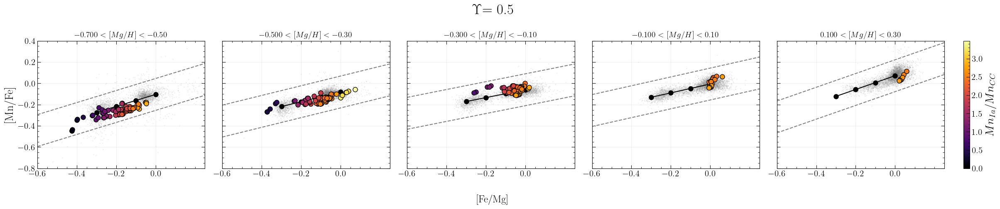

In [17]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

# --- Set figure dimensions directly ---
fig_x = 24
fig_y = 5
gals_list = gals_list_0
ups_this_plot = gals_list[0].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_FE'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_fe[i] * fe_mg_bin_centers + intercepts_mn_fe[i]
    y_lower = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] - 0.15
    y_upper = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # Plot parallel lines +/- 0.1 dex
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color='gray', linestyle='--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color='gray', linestyle='--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_fe = gal.Mn_Fe[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))
            
            sfr = gal.m_g_array
            if np.array_equal(sfr, m_g_array_const):
                sfr_label = "const SFR"
            elif np.array_equal(sfr, m_g_array_exp):
                sfr_label = "exp SFR"
            elif np.array_equal(sfr, m_g_array_rise_fall_1):
                sfr_label = "rise+fall  1"
            elif np.array_equal(sfr, m_g_array_rise_fall_2):
                sfr_label = "rise+fall  2"
            elif np.array_equal(sfr, m_g_array_rise_fall_3):
                sfr_label = "rise+fall  3"
            else:
                sfr_label = "unknown SFR"

            ax.plot(fe_mg, mn_fe, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11,
                    label=rf"$\eta = {eta:.2f}, \ \tau_* = {taustar}$, {sfr_label}")

    if i == 0:
        ax.set_ylabel('[Mn/Fe]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-0.8, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()

# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


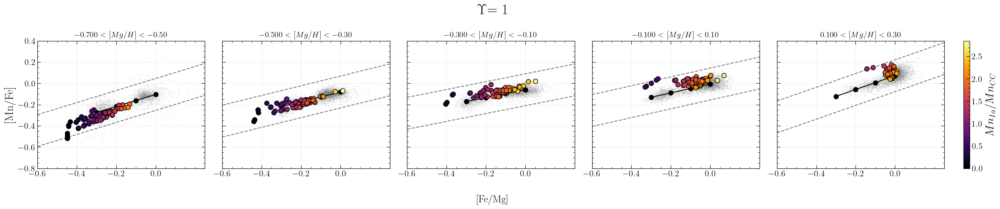

In [18]:
# --- Set figure dimensions directly ---
gals_list = gals_list_1
ups_this_plot = gals_list[1].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_FE'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_fe[i] * fe_mg_bin_centers + intercepts_mn_fe[i]
    y_lower = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] - 0.15
    y_upper = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # Plot parallel lines +/- 0.1 dex
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color='gray', linestyle='--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color='gray', linestyle='--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_fe = gal.Mn_Fe[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))
            
            sfr = gal.m_g_array
            if np.array_equal(sfr, m_g_array_const):
                sfr_label = "const SFR"
            elif np.array_equal(sfr, m_g_array_exp):
                sfr_label = "exp SFR"
            elif np.array_equal(sfr, m_g_array_rise_fall_1):
                sfr_label = "rise+fall  1"
            elif np.array_equal(sfr, m_g_array_rise_fall_2):
                sfr_label = "rise+fall  2"
            elif np.array_equal(sfr, m_g_array_rise_fall_3):
                sfr_label = "rise+fall  3"
            else:
                sfr_label = "unknown SFR"

            ax.plot(fe_mg, mn_fe, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11,
                    label=rf"$\eta = {eta:.2f}, \ \tau_* = {taustar}$, {sfr_label}")

    if i == 0:
        ax.set_ylabel('[Mn/Fe]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-0.8, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()

# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


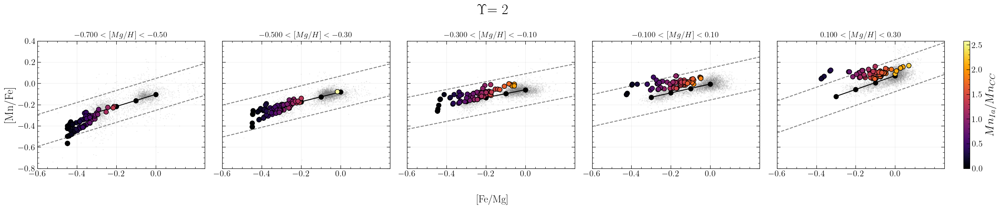

In [19]:
# --- Set figure dimensions directly ---
gals_list = gals_list_2
ups_this_plot = gals_list[2].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_FE'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_fe[i] * fe_mg_bin_centers + intercepts_mn_fe[i]
    y_lower = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] - 0.15
    y_upper = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # Plot parallel lines +/- 0.1 dex
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color='gray', linestyle='--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color='gray', linestyle='--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_fe = gal.Mn_Fe[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))
            
            sfr = gal.m_g_array
            if np.array_equal(sfr, m_g_array_const):
                sfr_label = "const SFR"
            elif np.array_equal(sfr, m_g_array_exp):
                sfr_label = "exp SFR"
            elif np.array_equal(sfr, m_g_array_rise_fall_1):
                sfr_label = "rise+fall  1"
            elif np.array_equal(sfr, m_g_array_rise_fall_2):
                sfr_label = "rise+fall  2"
            elif np.array_equal(sfr, m_g_array_rise_fall_3):
                sfr_label = "rise+fall  3"
            else:
                sfr_label = "unknown SFR"

            ax.plot(fe_mg, mn_fe, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11,
                    label=rf"$\eta = {eta:.2f}, \ \tau_* = {taustar}$, {sfr_label}")

    if i == 0:
        ax.set_ylabel('[Mn/Fe]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-0.8, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()
# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


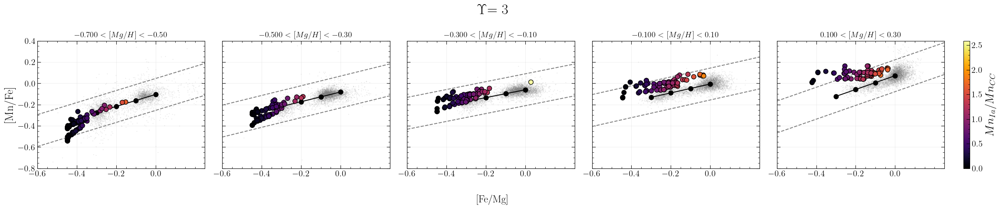

In [20]:
# --- Set figure dimensions directly ---
gals_list = gals_list_3
ups_this_plot = gals_list[3].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_FE'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_fe[i] * fe_mg_bin_centers + intercepts_mn_fe[i]
    y_lower = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] - 0.15
    y_upper = slopes_mn_fe[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_fe[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # Plot parallel lines +/- 0.1 dex
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color='gray', linestyle='--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color='gray', linestyle='--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_fe = gal.Mn_Fe[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))
            
            sfr = gal.m_g_array
            if np.array_equal(sfr, m_g_array_const):
                sfr_label = "const SFR"
            elif np.array_equal(sfr, m_g_array_exp):
                sfr_label = "exp SFR"
            elif np.array_equal(sfr, m_g_array_rise_fall_1):
                sfr_label = "rise+fall  1"
            elif np.array_equal(sfr, m_g_array_rise_fall_2):
                sfr_label = "rise+fall  2"
            elif np.array_equal(sfr, m_g_array_rise_fall_3):
                sfr_label = "rise+fall  3"
            else:
                sfr_label = "unknown SFR"

            ax.plot(fe_mg, mn_fe, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11,
                    label=rf"$\eta = {eta:.2f}, \ \tau_* = {taustar}$, {sfr_label}")

    if i == 0:
        ax.set_ylabel('[Mn/Fe]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-0.8, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()
# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label(r'$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

# B) [Mn/Mg] vs [Fe/Mg] plots

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


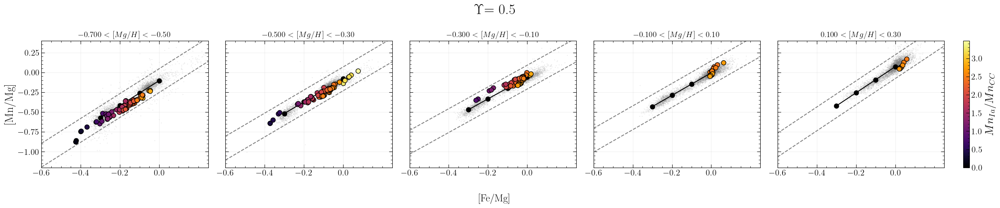

In [21]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

# --- Set figure dimensions directly ---
fig_x = 24
fig_y = 5
gals_list = gals_list_0
ups_this_plot = gals_list[0].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_MG'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_mg[i] * fe_mg_bin_centers + intercepts_mn_mg[i]
    y_lower = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] - 0.15
    y_upper = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # --- Plot parallel lines +/- 0.1 dex ---
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color = 'gray', linestyle = '--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color = 'gray', linestyle = '--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_mg = gal.Mn_Mg[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))

            ax.plot(fe_mg, mn_mg, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11)

    if i == 0:
        ax.set_ylabel('[Mn/Mg]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-1.2, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()
# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label('$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


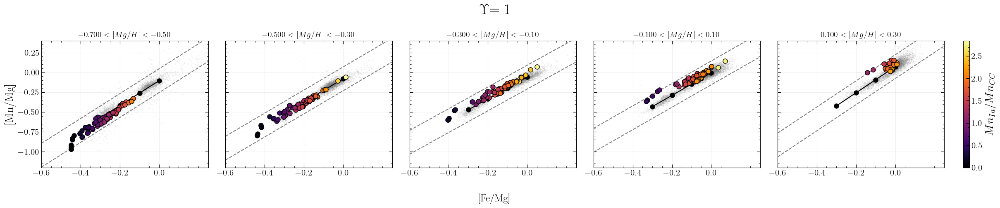

In [22]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

# --- Set figure dimensions directly ---
gals_list = gals_list_1
ups_this_plot = gals_list[1].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_MG'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_mg[i] * fe_mg_bin_centers + intercepts_mn_mg[i]
    y_lower = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] - 0.15
    y_upper = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # --- Plot parallel lines +/- 0.1 dex ---
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color = 'gray', linestyle = '--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color = 'gray', linestyle = '--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_mg = gal.Mn_Mg[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))

            ax.plot(fe_mg, mn_mg, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11)

    if i == 0:
        ax.set_ylabel('[Mn/Mg]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-1.2, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()

# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label('$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


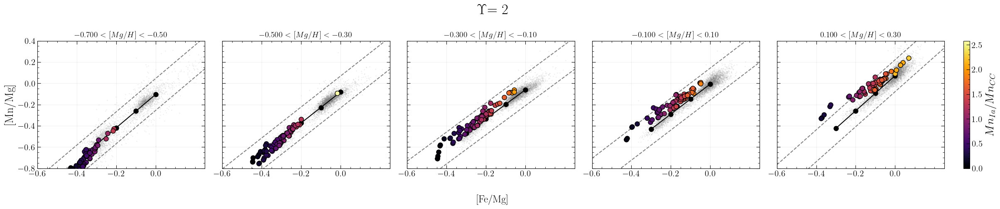

In [23]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

# --- Set figure dimensions directly ---
gals_list = gals_list_2
ups_this_plot = gals_list[2].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_MG'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_mg[i] * fe_mg_bin_centers + intercepts_mn_mg[i]
    y_lower = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] - 0.15
    y_upper = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # --- Plot parallel lines +/- 0.1 dex ---
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color = 'gray', linestyle = '--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color = 'gray', linestyle = '--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_mg = gal.Mn_Mg[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))

            ax.plot(fe_mg, mn_mg, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11)

    if i == 0:
        ax.set_ylabel('[Mn/Mg]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-0.8, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()
# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label('$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

/var/folders/g0/fl404sj151l2v9xcdkjz9fq80000gn/T/ipykernel_4860/3203722190.py:35: RuntimeWarning: invalid value encountered in divide
  ratio = gal.compute_z_X_Ia() / gal.compute_z_X_CC()


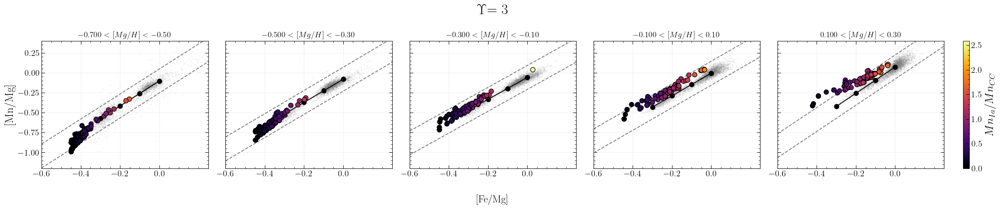

In [24]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import numpy as np

# --- Set figure dimensions directly ---
gals_list = gals_list_3
ups_this_plot = gals_list[3].Upsilon

# --- 1. Pre-calculate endpoints and ratios FIRST ---
gals_endpoints = find_endpoints(gals_list, mg_h_big_bin_centers)
mn_ratios, mn_max = compute_ratios(gals_list, gals_endpoints, element='X') 

# --- 2. Setup Colormap based on the ratio range ---
norm = mcolors.Normalize(vmin=0, vmax=mn_max)
cmap = plt.get_cmap('inferno')

fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
axes = axes.flatten()

for i, ax in enumerate(axes):
    # Plot background data
    downsampled_data = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled_data['FE_MG'], downsampled_data['MN_MG'], s=0.1, color='gray', alpha=0.3)

    # Plot median line
    y_centers = slopes_mn_mg[i] * fe_mg_bin_centers + intercepts_mn_mg[i]
    y_lower = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] - 0.15
    y_upper = slopes_mn_mg[i] * np.linspace(-0.6, 0.25, 100) + intercepts_mn_mg[i] + 0.15
    ax.plot(fe_mg_bin_centers, y_centers, '-o', color='black', ms=8, zorder=10)

    # --- Plot parallel lines +/- 0.1 dex ---
    ax.plot(np.linspace(-0.6, 0.25, 100), y_lower, color = 'gray', linestyle = '--')
    ax.plot(np.linspace(-0.6, 0.25, 100), y_upper, color = 'gray', linestyle = '--')

    # idxs contains the stopping index for EACH galaxy in gals_list for this bin 'i'
    idxs = gals_endpoints[i]

    for k, (gal, idx) in enumerate(zip(gals_list, idxs)):
        if idx != -1:  # Ensure the galaxy actually crossed this bin center
            fe_mg = gal.Fe_Mg[idx]
            mn_mg = gal.Mn_Mg[idx]
            
            eta = gal.eta_arr[0]
            taustar = gal.tau_star_arr[0]
            
            # --- 3. Extract dynamic color from ratio array ---
            ratio_val = mn_ratios[k][idx]
            current_color = cmap(norm(ratio_val))

            ax.plot(fe_mg, mn_mg, marker='o', color=current_color, linewidth=0,
                    markeredgecolor='black', markersize=8, zorder=11)

    if i == 0:
        ax.set_ylabel('[Mn/Mg]')
    
    ax.set_title(
        rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$',
        fontsize=14
    )
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set_xlim(-0.60, 0.25)
    ax.set_ylim(-1.2, 0.40)

fig.supxlabel('[Fe/Mg]')
plt.suptitle(r"$\Upsilon$" + f"= {ups_this_plot}", fontsize=25)
fig.subplots_adjust(wspace=0)
plt.tight_layout()
plt.tight_layout()
# Add the colorbar using ScalarMappable
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([]) 
cbar = fig.colorbar(sm, ax=axes, fraction=0.02, pad=0.02)
cbar.set_label('$Mn_{Ia} / Mn_{CC} $', fontsize=20) # Updated label

plt.show()

Text(0, 0.5, 'log(y_Ia/y_cc)')

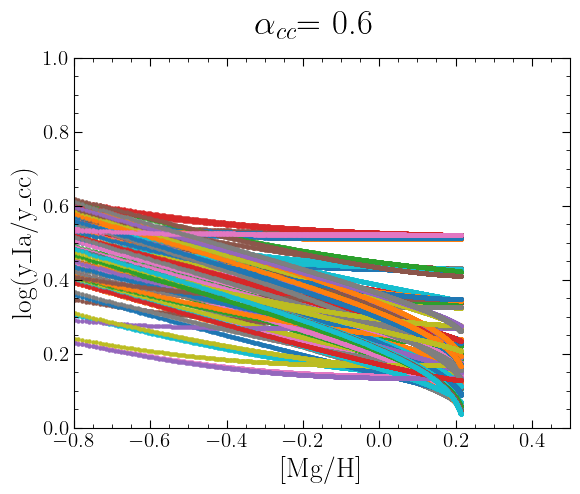

In [25]:
example_gal = gals_list_2[0]

for gal in gals_list_2:
    y_Ia_y_cc = gal.compute_y_Mn_Ia()/gal.compute_y_Mn_CC()
    plt.scatter(example_gal.Mg_H, np.log10(y_Ia_y_cc), s = 5)

plt.suptitle(r"$\alpha_{cc}$" + f"= {alpha_cc_def}", fontsize=25)
plt.xlim(-0.8, 0.5)
plt.ylim(0,1)

plt.xlabel('[Mg/H]')
plt.ylabel('log(y_Ia/y_cc)')

[-6.         -4.54855278 -2.71074593 -2.41253464 -2.237408   -2.11300681
 -2.0164739  -1.93759352 -1.87090595 -1.81314826 -1.76221404 -1.71666416
 -1.67547169 -1.6378781  -1.60330718 -1.57131095 -1.54153417 -1.51369044
 -1.48754548 -1.46290517 -1.4396069  -1.41751308 -1.39650628 -1.37648543
 -1.35736296 -1.33906249 -1.32151697 -1.30466726 -1.28846091 -1.27285118
 -1.25779627 -1.24325861 -1.22920435 -1.21560285 -1.2024263  -1.18964938
 -1.17724896 -1.1652039  -1.15349475 -1.14210366 -1.13101414 -1.12021096
 -1.10968004 -1.09940828 -1.08938353 -1.07959448 -1.07003056 -1.06068192
 -1.05153933 -1.04259416 -1.03383829 -1.02526412 -1.01686447 -1.00863261
 -1.00056217 -0.99264715 -0.98488187 -0.97726097 -0.96977937 -0.96243225
 -0.95521504 -0.9481234  -0.9411532  -0.93430053 -0.92756164 -0.92093299
 -0.91441117 -0.90799295 -0.90167524 -0.89545507 -0.88932964 -0.88329623
 -0.87735225 -0.87149524 -0.8657228  -0.86003266 -0.85442263 -0.84889061
 -0.84343458 -0.8380526  -0.8327428  -0.82750339 -0

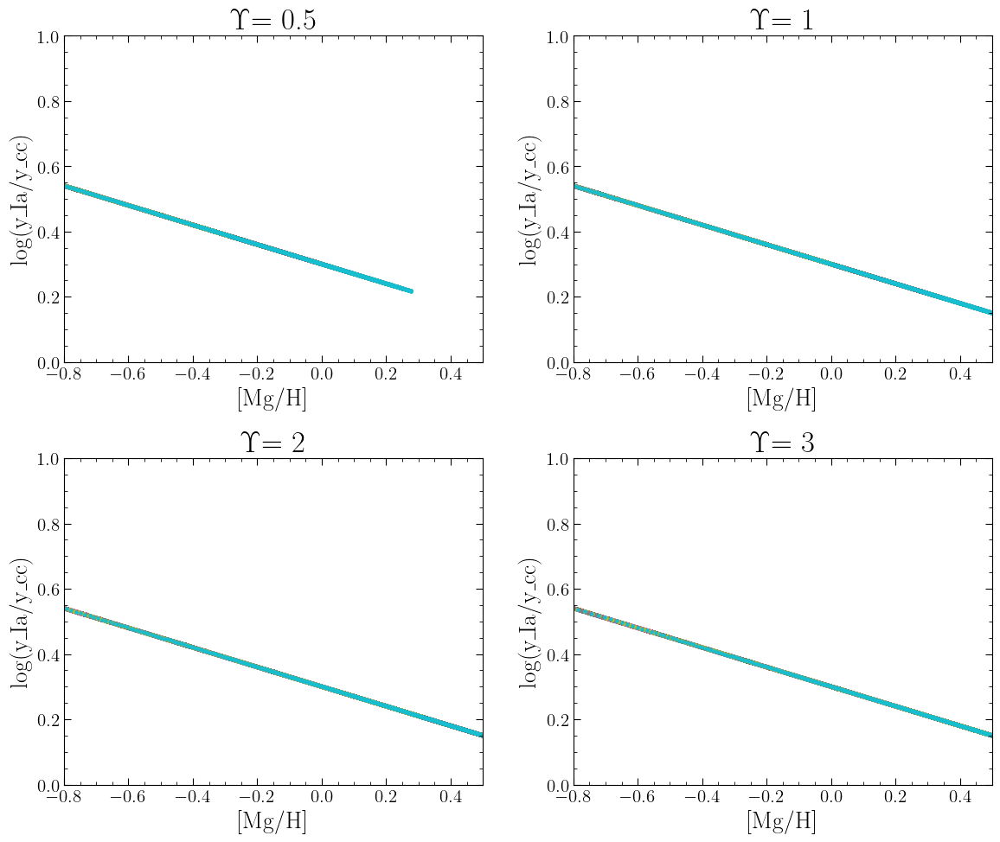

In [26]:
plt.figure(figsize=(12,10))

plt.subplot(2,2,1)
example_gal = gals_list_0[0]
for gal in gals_list_0:
    y_Ia_y_cc = gal.compute_y_Mn_Ia()/gal.compute_y_Mn_CC()
    plt.scatter(gal.Mg_H, np.log10(y_Ia_y_cc), s = 5)
plt.title(r"$\Upsilon$" + f"= {example_gal.Upsilon}", fontsize=25)
plt.xlim(-0.8, 0.5)
plt.ylim(0,1)

plt.xlabel('[Mg/H]')
plt.ylabel('log(y_Ia/y_cc)')


plt.subplot(2,2,2)
example_gal = gals_list_1[0]
for gal in gals_list_1:
    y_Ia_y_cc = gal.compute_y_Mn_Ia()/gal.compute_y_Mn_CC()
    print(example_gal.Mg_H)
    plt.scatter(gal.Mg_H, np.log10(y_Ia_y_cc), s = 5)
plt.title(r"$\Upsilon$" + f"= {example_gal.Upsilon}", fontsize=25)
plt.xlim(-0.8, 0.5)
plt.ylim(0,1)

plt.xlabel('[Mg/H]')
plt.ylabel('log(y_Ia/y_cc)')


plt.subplot(2,2,3)
example_gal = gals_list_2[0]
for gal in gals_list_2:
    y_Ia_y_cc = gal.compute_y_Mn_Ia()/gal.compute_y_Mn_CC()
    print(y_Ia_y_cc)
    plt.scatter(gal.Mg_H, np.log10(y_Ia_y_cc), s = 5, alpha = 1)
plt.title(r"$\Upsilon$" + f"= {example_gal.Upsilon}", fontsize=25)
plt.xlim(-0.8, 0.5)
plt.ylim(0,1)

plt.xlabel('[Mg/H]')
plt.ylabel('log(y_Ia/y_cc)')


plt.subplot(2,2,4)
example_gal = gals_list_3[0]
for gal in gals_list_3:
    y_Ia_y_cc = gal.compute_y_Mn_Ia()/gal.compute_y_Mn_CC()
    plt.scatter(gal.Mg_H, np.log10(y_Ia_y_cc), s = 5)
plt.title(r"$\Upsilon$" + f"= {example_gal.Upsilon}", fontsize=25)
plt.xlim(-0.8, 0.5)
plt.ylim(0,1)

plt.xlabel('[Mg/H]')
plt.ylabel('log(y_Ia/y_cc)')

plt.tight_layout()

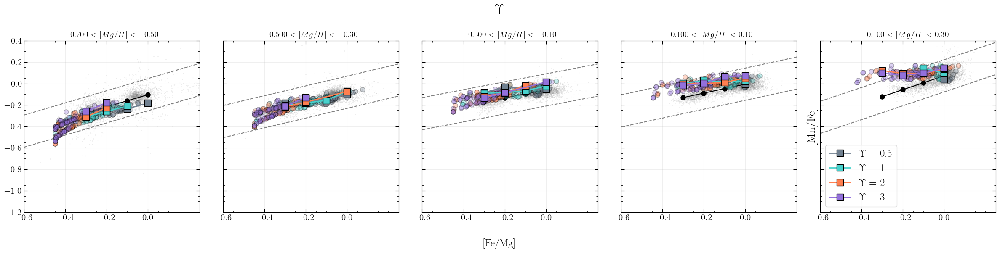

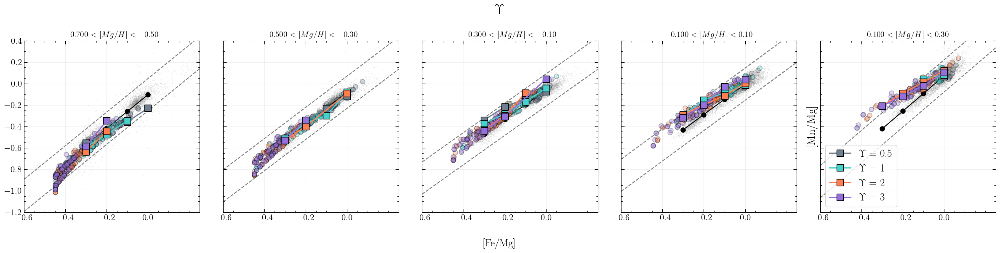

In [30]:
# --- Pre-calculate setup ---
fig_x, fig_y = 24, 6
alpha_cc_this_plot = gals_list_0[0].alpha_cc_Mn

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Loop through configurations to save space ---
plot_configs = [
    ('Mn_Fe', 'MN_FE', slopes_mn_fe, intercepts_mn_fe, '[Mn/Fe]'),
    ('Mn_Mg', 'MN_MG', slopes_mn_mg, intercepts_mn_mg, '[Mn/Mg]')
]

for gal_attr, data_col, slopes, intercepts, y_label in plot_configs:
    
    fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
    median_data = []

    for i, ax in enumerate(axes.flatten()):
        # Plot background data
        downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
        ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

        # Plot median background line
        x_line = np.linspace(-0.6, 0.25, 100)
        ax.plot(fe_mg_bin_centers, slopes[i] * fe_mg_bin_centers + intercepts[i], '-o', color='black', ms=8, zorder=10)
        ax.plot(x_line, slopes[i] * x_line + intercepts[i] - 0.15, color='gray', linestyle='--')
        ax.plot(x_line, slopes[i] * x_line + intercepts[i] + 0.15, color='gray', linestyle='--')

        # --- Loop through each galaxy list (0, 1, 2, 3) ---
        for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
            bin_x, bin_y = [], []
            gals_endpoints = all_endpoints[list_idx]
            
            for k, (gal, idx) in enumerate(zip(gals_list, gals_endpoints[i])):
                if idx != -1:  
                    x_val = gal.Fe_Mg[idx]
                    y_val = getattr(gal, gal_attr)[idx]  
                    
                    bin_x.append(x_val)
                    bin_y.append(y_val)

                    ax.plot(x_val, y_val, marker='o', color=pt_color, alpha=0.3,
                            linewidth=0, markeredgecolor='black', markersize=8, zorder=11)

            # --- Calculate binned medians for THIS simulated list ---
            if bin_x and bin_y:
                temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
                
                temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
                running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
                
                if not running_medians.empty:
                    med_x = running_medians.index.astype(float)
                    med_y = running_medians.values
                    
                    # Plot the connected running median line matching the model's color
                    ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                            marker='s', markersize=12, markeredgecolor='black', zorder=15,
                            label=model_name if i == 4 else "")
                    
                    for mx, my in zip(med_x, med_y):
                        median_data.append({
                            'Model_ID': list_idx,
                            y_label: my, 
                            '[Fe/Mg]': mx, 
                            'Mg_H_bin_index': i, 
                            'Mg_H_bin_center': mg_h_big_bin_centers[i]
                        })
        
        # Subplot formatting
        if i == 4: 
            ax.set_ylabel(y_label)
            ax.legend(loc='lower left', fontsize=18)
            
        ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=14)
        ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
        ax.grid(True, alpha=0.2)
        ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

    # Finalize Figure
    fig.supxlabel('[Fe/Mg]')
    plt.suptitle(r"$\Upsilon$", fontsize=25)
    fig.subplots_adjust(wspace=0)
    plt.tight_layout()

    plt.show()

    # Output dataframe for this specific variable
    df_medians = pd.DataFrame(median_data)

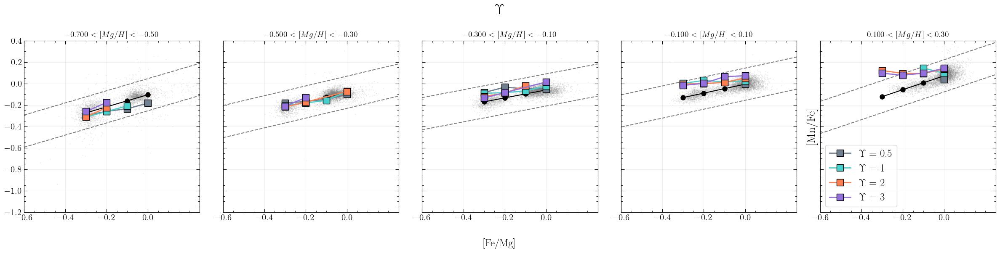

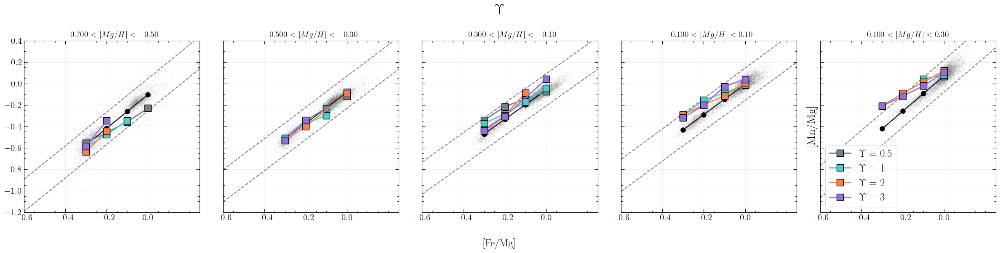

In [29]:
# --- Pre-calculate setup ---
fig_x, fig_y = 24, 6
alpha_cc_this_plot = gals_list_0[0].alpha_cc_Mn

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Loop through configurations to save space ---
plot_configs = [
    ('Mn_Fe', 'MN_FE', slopes_mn_fe, intercepts_mn_fe, '[Mn/Fe]'),
    ('Mn_Mg', 'MN_MG', slopes_mn_mg, intercepts_mn_mg, '[Mn/Mg]')
]

for gal_attr, data_col, slopes, intercepts, y_label in plot_configs:
    
    fig, axes = plt.subplots(1, 5, figsize=(fig_x, fig_y), sharex=True, sharey=True)
    median_data = []

    for i, ax in enumerate(axes.flatten()):
        # Plot background data
        downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
        ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

        # Plot median background line
        x_line = np.linspace(-0.6, 0.25, 100)
        ax.plot(fe_mg_bin_centers, slopes[i] * fe_mg_bin_centers + intercepts[i], '-o', color='black', ms=8, zorder=10)
        ax.plot(x_line, slopes[i] * x_line + intercepts[i] - 0.15, color='gray', linestyle='--')
        ax.plot(x_line, slopes[i] * x_line + intercepts[i] + 0.15, color='gray', linestyle='--')

        # --- Loop through each galaxy list (0, 1, 2, 3) ---
        for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
            bin_x, bin_y = [], []
            gals_endpoints = all_endpoints[list_idx]
            
            for k, (gal, idx) in enumerate(zip(gals_list, gals_endpoints[i])):
                if idx != -1:  
                    x_val = gal.Fe_Mg[idx]
                    y_val = getattr(gal, gal_attr)[idx]  
                    
                    bin_x.append(x_val)
                    bin_y.append(y_val)

                    #ax.plot(x_val, y_val, marker='o', color=pt_color, alpha=0.3,
                    #        linewidth=0, markeredgecolor='black', markersize=8, zorder=11)

            # --- Calculate binned medians for THIS simulated list ---
            if bin_x and bin_y:
                temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
                
                temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
                running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
                
                if not running_medians.empty:
                    med_x = running_medians.index.astype(float)
                    med_y = running_medians.values
                    
                    # Plot the connected running median line matching the model's color
                    ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                            marker='s', markersize=12, markeredgecolor='black', zorder=15,
                            label=model_name if i == 4 else "")
                    
                    for mx, my in zip(med_x, med_y):
                        median_data.append({
                            'Model_ID': list_idx,
                            y_label: my, 
                            '[Fe/Mg]': mx, 
                            'Mg_H_bin_index': i, 
                            'Mg_H_bin_center': mg_h_big_bin_centers[i]
                        })
        
        # Subplot formatting
        if i == 4: 
            ax.set_ylabel(y_label)
            ax.legend(loc='lower left', fontsize=18)
            
        ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=14)
        ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
        ax.grid(True, alpha=0.2)
        ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

    # Finalize Figure
    fig.supxlabel('[Fe/Mg]')
    plt.suptitle(r"$\Upsilon$", fontsize=25)
    fig.subplots_adjust(wspace=0)
    plt.tight_layout()

    plt.show()

    # Output dataframe for this specific variable
    df_medians = pd.DataFrame(median_data)

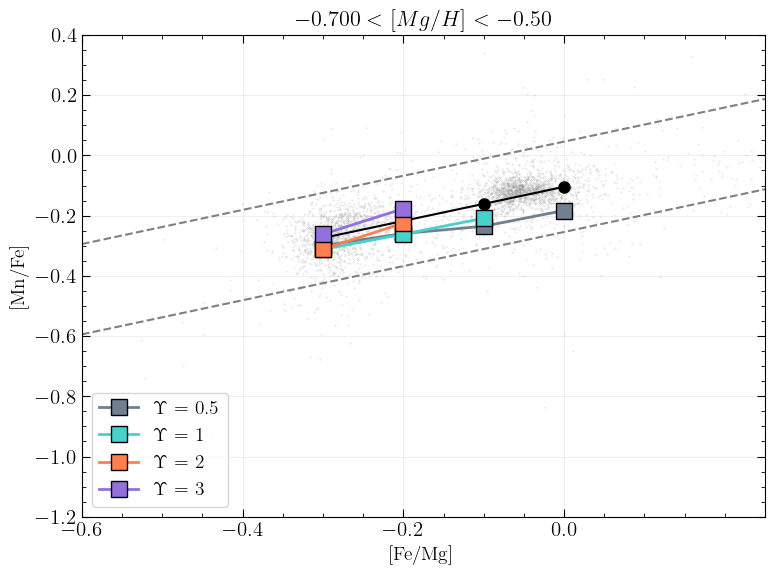

In [31]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# --- Pre-calculate setup ---
fig_x, fig_y = 8, 6  # Adjusted for a single plot
i = 0                # We only want the first Mg/H bin

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Configuration for Mn/Fe ---
gal_attr = 'Mn_Fe'
data_col = 'MN_FE'
y_label = '[Mn/Fe]'
slope = slopes_mn_fe[i]
intercept = intercepts_mn_fe[i]

fig, ax = plt.subplots(figsize=(fig_x, fig_y))
median_data = []

# Plot background data
downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

# Plot median background line
x_line = np.linspace(-0.6, 0.25, 100)
ax.plot(fe_mg_bin_centers, slope * fe_mg_bin_centers + intercept, '-o', color='black', ms=8, zorder=10)
ax.plot(x_line, slope * x_line + intercept - 0.15, color='gray', linestyle='--')
ax.plot(x_line, slope * x_line + intercept + 0.15, color='gray', linestyle='--')

# --- Loop through each galaxy list (0, 1, 2, 3) ---
for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
    bin_x, bin_y = [], []
    gals_endpoints = all_endpoints[list_idx]
    
    for gal, idx in zip(gals_list, gals_endpoints[i]):
        if idx != -1:  
            x_val = gal.Fe_Mg[idx]
            y_val = getattr(gal, gal_attr)[idx]  
            
            bin_x.append(x_val)
            bin_y.append(y_val)

    # --- Calculate binned medians for THIS simulated list ---
    if bin_x and bin_y:
        temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
        
        temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
        running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
        
        if not running_medians.empty:
            med_x = running_medians.index.astype(float)
            med_y = running_medians.values
            
            # Plot the connected running median line matching the model's color
            ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                    marker='s', markersize=12, markeredgecolor='black', zorder=15,
                    label=model_name)
            
            for mx, my in zip(med_x, med_y):
                median_data.append({
                    'Model_ID': list_idx,
                    y_label: my, 
                    '[Fe/Mg]': mx, 
                    'Mg_H_bin_index': i, 
                    'Mg_H_bin_center': mg_h_big_bin_centers[i]
                })

# Subplot formatting
ax.set_ylabel(y_label, fontsize=14)
ax.set_xlabel('[Fe/Mg]', fontsize=14)
ax.legend(loc='lower left', fontsize=14)
    
ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=16)
ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
ax.grid(True, alpha=0.2)
ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

plt.tight_layout()
plt.show()

# Output dataframe for this specific variable
df_medians = pd.DataFrame(median_data)

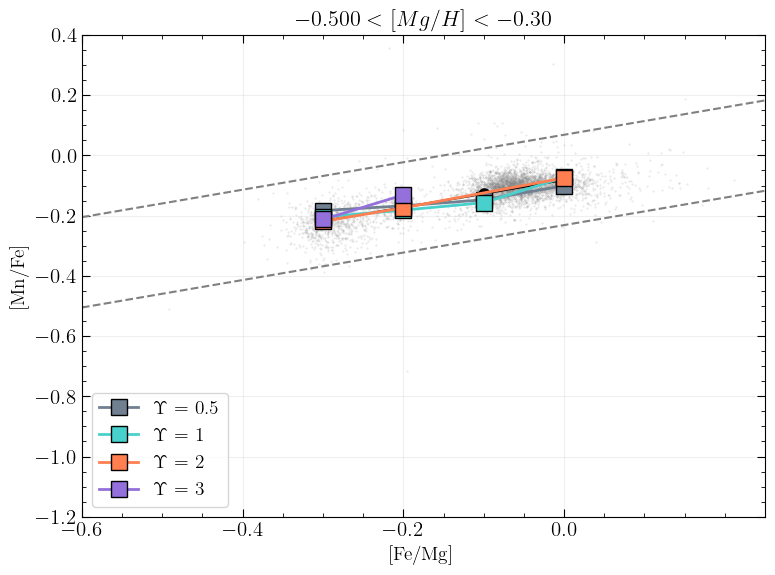

In [32]:
# --- Pre-calculate setup ---
fig_x, fig_y = 8, 6  # Adjusted for a single plot
i = 1               # We only want the first Mg/H bin

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Configuration for Mn/Fe ---
gal_attr = 'Mn_Fe'
data_col = 'MN_FE'
y_label = '[Mn/Fe]'
slope = slopes_mn_fe[i]
intercept = intercepts_mn_fe[i]

fig, ax = plt.subplots(figsize=(fig_x, fig_y))
median_data = []

# Plot background data
downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

# Plot median background line
x_line = np.linspace(-0.6, 0.25, 100)
ax.plot(fe_mg_bin_centers, slope * fe_mg_bin_centers + intercept, '-o', color='black', ms=8, zorder=10)
ax.plot(x_line, slope * x_line + intercept - 0.15, color='gray', linestyle='--')
ax.plot(x_line, slope * x_line + intercept + 0.15, color='gray', linestyle='--')

# --- Loop through each galaxy list (0, 1, 2, 3) ---
for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
    bin_x, bin_y = [], []
    gals_endpoints = all_endpoints[list_idx]
    
    for gal, idx in zip(gals_list, gals_endpoints[i]):
        if idx != -1:  
            x_val = gal.Fe_Mg[idx]
            y_val = getattr(gal, gal_attr)[idx]  
            
            bin_x.append(x_val)
            bin_y.append(y_val)

    # --- Calculate binned medians for THIS simulated list ---
    if bin_x and bin_y:
        temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
        
        temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
        running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
        
        if not running_medians.empty:
            med_x = running_medians.index.astype(float)
            med_y = running_medians.values
            
            # Plot the connected running median line matching the model's color
            ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                    marker='s', markersize=12, markeredgecolor='black', zorder=15,
                    label=model_name)
            
            for mx, my in zip(med_x, med_y):
                median_data.append({
                    'Model_ID': list_idx,
                    y_label: my, 
                    '[Fe/Mg]': mx, 
                    'Mg_H_bin_index': i, 
                    'Mg_H_bin_center': mg_h_big_bin_centers[i]
                })

# Subplot formatting
ax.set_ylabel(y_label, fontsize=14)
ax.set_xlabel('[Fe/Mg]', fontsize=14)
ax.legend(loc='lower left', fontsize=14)
    
ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=16)
ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
ax.grid(True, alpha=0.2)
ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

plt.tight_layout()
plt.show()

# Output dataframe for this specific variable
df_medians = pd.DataFrame(median_data)

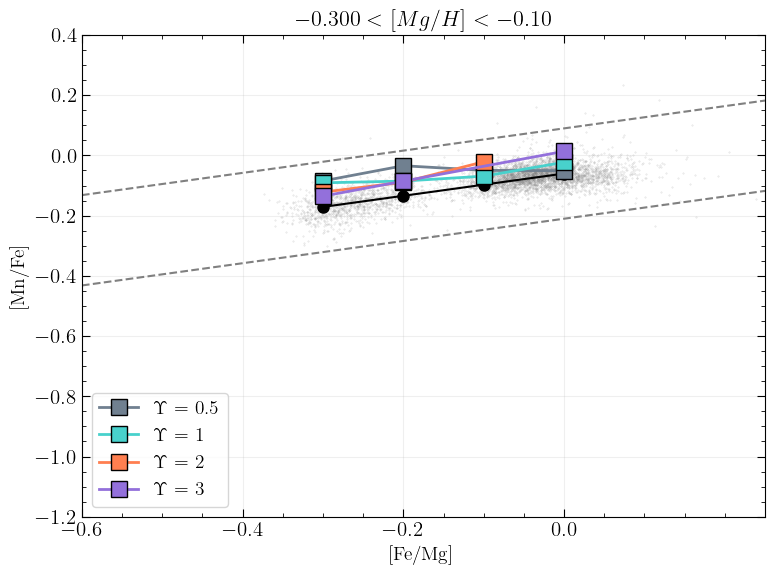

In [33]:
# --- Pre-calculate setup ---
fig_x, fig_y = 8, 6  # Adjusted for a single plot
i = 2               # We only want the first Mg/H bin

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Configuration for Mn/Fe ---
gal_attr = 'Mn_Fe'
data_col = 'MN_FE'
y_label = '[Mn/Fe]'
slope = slopes_mn_fe[i]
intercept = intercepts_mn_fe[i]

fig, ax = plt.subplots(figsize=(fig_x, fig_y))
median_data = []

# Plot background data
downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

# Plot median background line
x_line = np.linspace(-0.6, 0.25, 100)
ax.plot(fe_mg_bin_centers, slope * fe_mg_bin_centers + intercept, '-o', color='black', ms=8, zorder=10)
ax.plot(x_line, slope * x_line + intercept - 0.15, color='gray', linestyle='--')
ax.plot(x_line, slope * x_line + intercept + 0.15, color='gray', linestyle='--')

# --- Loop through each galaxy list (0, 1, 2, 3) ---
for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
    bin_x, bin_y = [], []
    gals_endpoints = all_endpoints[list_idx]
    
    for gal, idx in zip(gals_list, gals_endpoints[i]):
        if idx != -1:  
            x_val = gal.Fe_Mg[idx]
            y_val = getattr(gal, gal_attr)[idx]  
            
            bin_x.append(x_val)
            bin_y.append(y_val)

    # --- Calculate binned medians for THIS simulated list ---
    if bin_x and bin_y:
        temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
        
        temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
        running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
        
        if not running_medians.empty:
            med_x = running_medians.index.astype(float)
            med_y = running_medians.values
            
            # Plot the connected running median line matching the model's color
            ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                    marker='s', markersize=12, markeredgecolor='black', zorder=15,
                    label=model_name)
            
            for mx, my in zip(med_x, med_y):
                median_data.append({
                    'Model_ID': list_idx,
                    y_label: my, 
                    '[Fe/Mg]': mx, 
                    'Mg_H_bin_index': i, 
                    'Mg_H_bin_center': mg_h_big_bin_centers[i]
                })

# Subplot formatting
ax.set_ylabel(y_label, fontsize=14)
ax.set_xlabel('[Fe/Mg]', fontsize=14)
ax.legend(loc='lower left', fontsize=14)
    
ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=16)
ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
ax.grid(True, alpha=0.2)
ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

plt.tight_layout()
plt.show()

# Output dataframe for this specific variable
df_medians = pd.DataFrame(median_data)

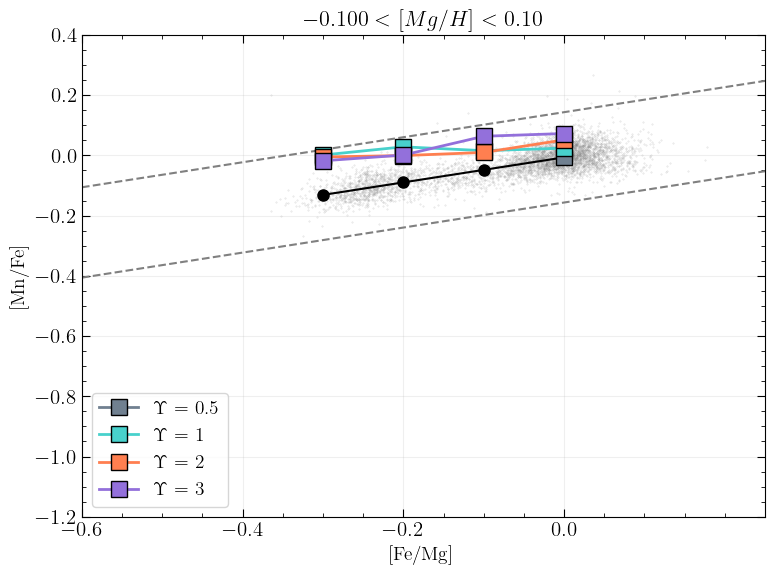

In [34]:
# --- Pre-calculate setup ---
fig_x, fig_y = 8, 6  # Adjusted for a single plot
i = 3               # We only want the first Mg/H bin

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Configuration for Mn/Fe ---
gal_attr = 'Mn_Fe'
data_col = 'MN_FE'
y_label = '[Mn/Fe]'
slope = slopes_mn_fe[i]
intercept = intercepts_mn_fe[i]

fig, ax = plt.subplots(figsize=(fig_x, fig_y))
median_data = []

# Plot background data
downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

# Plot median background line
x_line = np.linspace(-0.6, 0.25, 100)
ax.plot(fe_mg_bin_centers, slope * fe_mg_bin_centers + intercept, '-o', color='black', ms=8, zorder=10)
ax.plot(x_line, slope * x_line + intercept - 0.15, color='gray', linestyle='--')
ax.plot(x_line, slope * x_line + intercept + 0.15, color='gray', linestyle='--')

# --- Loop through each galaxy list (0, 1, 2, 3) ---
for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
    bin_x, bin_y = [], []
    gals_endpoints = all_endpoints[list_idx]
    
    for gal, idx in zip(gals_list, gals_endpoints[i]):
        if idx != -1:  
            x_val = gal.Fe_Mg[idx]
            y_val = getattr(gal, gal_attr)[idx]  
            
            bin_x.append(x_val)
            bin_y.append(y_val)

    # --- Calculate binned medians for THIS simulated list ---
    if bin_x and bin_y:
        temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
        
        temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
        running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
        
        if not running_medians.empty:
            med_x = running_medians.index.astype(float)
            med_y = running_medians.values
            
            # Plot the connected running median line matching the model's color
            ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                    marker='s', markersize=12, markeredgecolor='black', zorder=15,
                    label=model_name)
            
            for mx, my in zip(med_x, med_y):
                median_data.append({
                    'Model_ID': list_idx,
                    y_label: my, 
                    '[Fe/Mg]': mx, 
                    'Mg_H_bin_index': i, 
                    'Mg_H_bin_center': mg_h_big_bin_centers[i]
                })

# Subplot formatting
ax.set_ylabel(y_label, fontsize=14)
ax.set_xlabel('[Fe/Mg]', fontsize=14)
ax.legend(loc='lower left', fontsize=14)
    
ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=16)
ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
ax.grid(True, alpha=0.2)
ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

plt.tight_layout()
plt.show()

# Output dataframe for this specific variable
df_medians = pd.DataFrame(median_data)

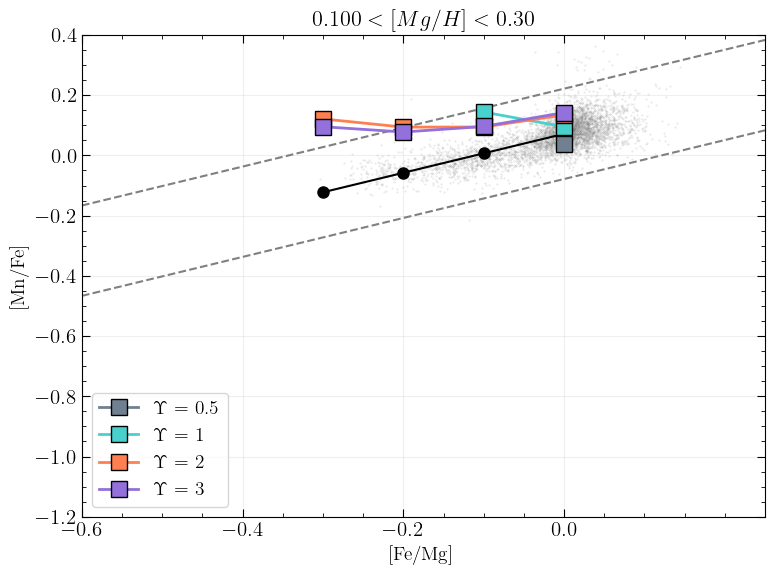

In [35]:
# --- Pre-calculate setup ---
fig_x, fig_y = 8, 6  # Adjusted for a single plot
i = 4               # We only want the first Mg/H bin

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Configuration for Mn/Fe ---
gal_attr = 'Mn_Fe'
data_col = 'MN_FE'
y_label = '[Mn/Fe]'
slope = slopes_mn_fe[i]
intercept = intercepts_mn_fe[i]

fig, ax = plt.subplots(figsize=(fig_x, fig_y))
median_data = []

# Plot background data
downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

# Plot median background line
x_line = np.linspace(-0.6, 0.25, 100)
ax.plot(fe_mg_bin_centers, slope * fe_mg_bin_centers + intercept, '-o', color='black', ms=8, zorder=10)
ax.plot(x_line, slope * x_line + intercept - 0.15, color='gray', linestyle='--')
ax.plot(x_line, slope * x_line + intercept + 0.15, color='gray', linestyle='--')

# --- Loop through each galaxy list (0, 1, 2, 3) ---
for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
    bin_x, bin_y = [], []
    gals_endpoints = all_endpoints[list_idx]
    
    for gal, idx in zip(gals_list, gals_endpoints[i]):
        if idx != -1:  
            x_val = gal.Fe_Mg[idx]
            y_val = getattr(gal, gal_attr)[idx]  
            
            bin_x.append(x_val)
            bin_y.append(y_val)

    # --- Calculate binned medians for THIS simulated list ---
    if bin_x and bin_y:
        temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
        
        temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
        running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
        
        if not running_medians.empty:
            med_x = running_medians.index.astype(float)
            med_y = running_medians.values
            
            # Plot the connected running median line matching the model's color
            ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                    marker='s', markersize=12, markeredgecolor='black', zorder=15,
                    label=model_name)
            
            for mx, my in zip(med_x, med_y):
                median_data.append({
                    'Model_ID': list_idx,
                    y_label: my, 
                    '[Fe/Mg]': mx, 
                    'Mg_H_bin_index': i, 
                    'Mg_H_bin_center': mg_h_big_bin_centers[i]
                })

# Subplot formatting
ax.set_ylabel(y_label, fontsize=14)
ax.set_xlabel('[Fe/Mg]', fontsize=14)
ax.legend(loc='lower left', fontsize=14)
    
ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=16)
ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
ax.grid(True, alpha=0.2)
ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

plt.tight_layout()
plt.show()

# Output dataframe for this specific variable
df_medians = pd.DataFrame(median_data)

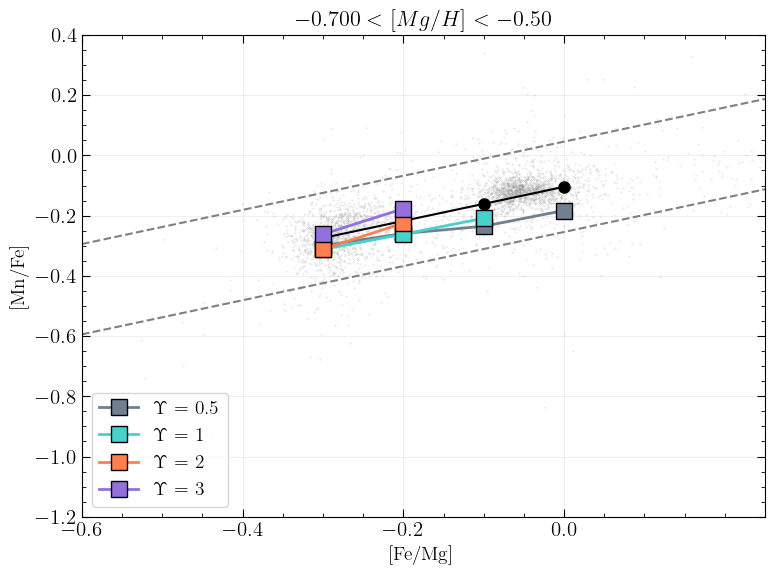

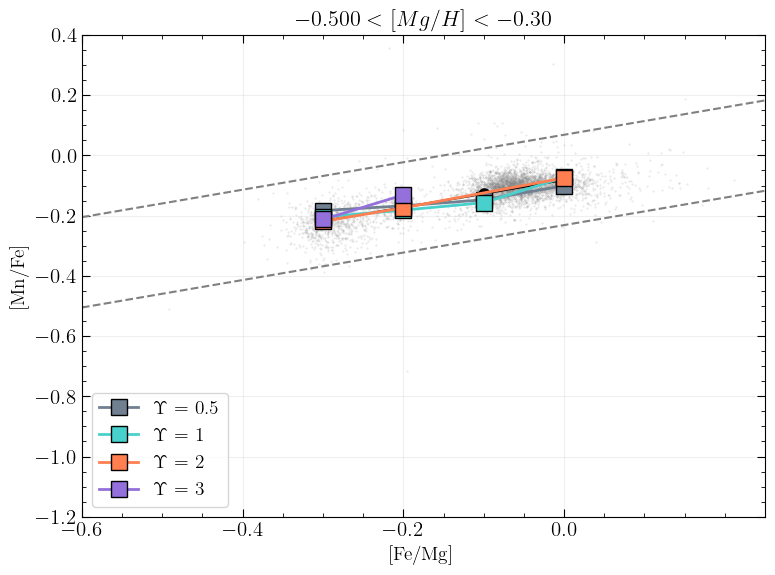

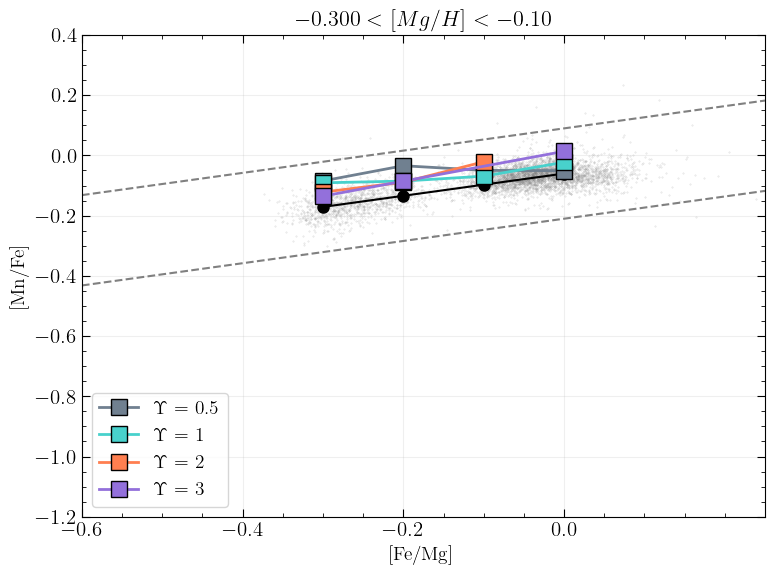

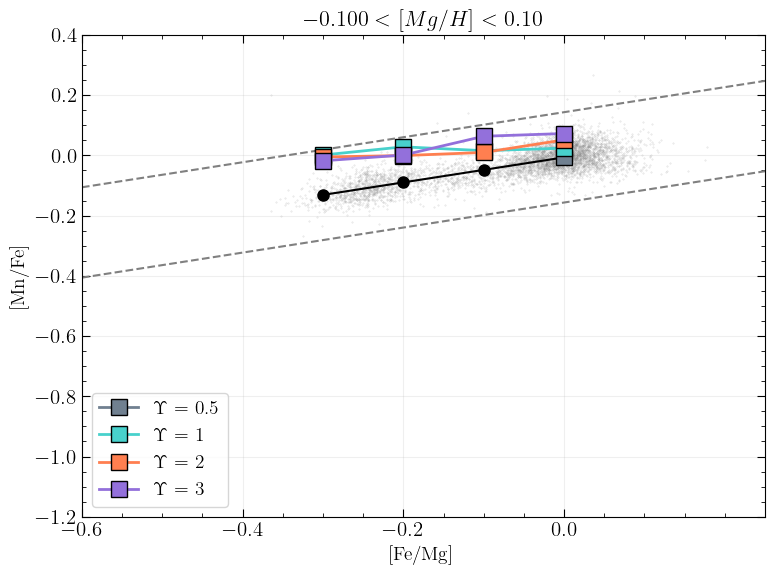

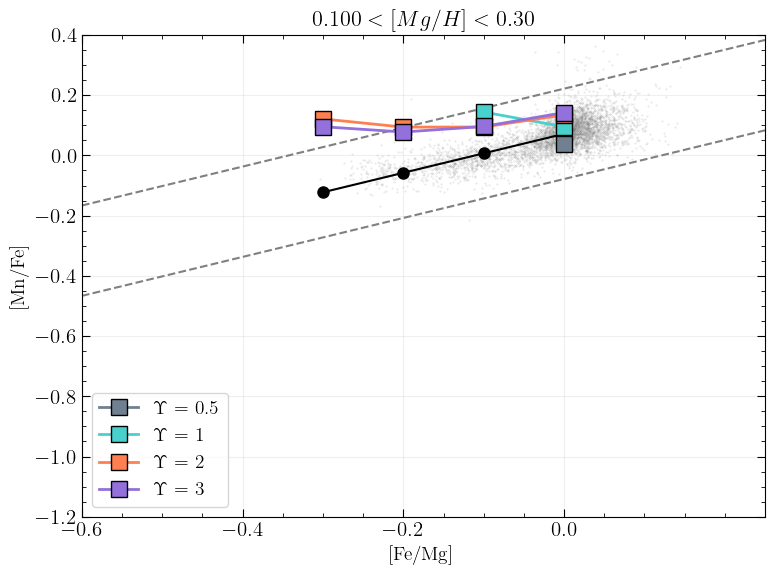


--- Medians across all bins ---
    Model_ID   [Mn/Fe]       [Fe/Mg]  Mg_H_bin_index  Mg_H_bin_center
0          0 -0.299655 -3.000000e-01               0             -0.6
1          0 -0.259314 -2.000000e-01               0             -0.6
2          0 -0.235289 -1.000000e-01               0             -0.6
3          0 -0.183029  4.163336e-17               0             -0.6
4          1 -0.311595 -3.000000e-01               0             -0.6
..       ...       ...           ...             ...              ...
57         2  0.134653  4.163336e-17               4              0.2
58         3  0.095197 -3.000000e-01               4              0.2
59         3  0.077586 -2.000000e-01               4              0.2
60         3  0.096036 -1.000000e-01               4              0.2
61         3  0.142251  4.163336e-17               4              0.2

[62 rows x 5 columns]


In [ ]:
# --- Pre-calculate setup ---
fig_x, fig_y = 8, 6  # Size for each individual plot

# Define the models and their corresponding colors
all_models = [
    (gals_list_0, 'slategray', r'$\Upsilon$ = ' + f"{gals_list_0[0].Upsilon}"),
    (gals_list_1, 'mediumturquoise', r'$\Upsilon$ = ' + f"{gals_list_1[0].Upsilon}"),
    (gals_list_2, 'coral', r'$\Upsilon$ = ' + f"{gals_list_2[0].Upsilon}"),
    (gals_list_3, 'mediumpurple', r'$\Upsilon$ = ' + f"{gals_list_3[0].Upsilon}")
]

# Pre-calculate endpoints for all 4 lists
all_endpoints = [find_endpoints(g_list, mg_h_big_bin_centers) for g_list, _, _ in all_models]

# Calculate bin edges from centers (assuming uniform spacing)
step = fe_mg_bin_centers[1] - fe_mg_bin_centers[0]
fe_mg_edges = np.append(fe_mg_bin_centers - step/2, fe_mg_bin_centers[-1] + step/2)

# --- Configuration for Mn/Fe ---
gal_attr = 'Mn_Fe'
data_col = 'MN_FE'
y_label = '[Mn/Fe]'

# List to collect median data across all models and all bins
median_data = []

# --- Loop over all Mg/H bins ---
for i in range(len(mg_h_big_bin_centers)):
    slope = slopes_mn_fe[i]
    intercept = intercepts_mn_fe[i]

    # Create a new figure for THIS bin
    fig, ax = plt.subplots(figsize=(fig_x, fig_y))
    
    # Plot background data
    downsampled = downsample(data[data['MG_H_big_bin'] == i], 5000)
    ax.scatter(downsampled['FE_MG'], downsampled[data_col], s=0.1, color='gray', alpha=0.3)

    # Plot median background line
    x_line = np.linspace(-0.6, 0.25, 100)
    ax.plot(fe_mg_bin_centers, slope * fe_mg_bin_centers + intercept, '-o', color='black', ms=8, zorder=10)
    ax.plot(x_line, slope * x_line + intercept - 0.15, color='gray', linestyle='--')
    ax.plot(x_line, slope * x_line + intercept + 0.15, color='gray', linestyle='--')

    # --- Loop through each galaxy list (0, 1, 2, 3) ---
    for list_idx, (gals_list, pt_color, model_name) in enumerate(all_models):
        bin_x, bin_y = [], []
        gals_endpoints = all_endpoints[list_idx]
        
        for gal, idx in zip(gals_list, gals_endpoints[i]):
            if idx != -1:  
                x_val = gal.Fe_Mg[idx]
                y_val = getattr(gal, gal_attr)[idx]  
                
                bin_x.append(x_val)
                bin_y.append(y_val)

        # --- Calculate binned medians for THIS simulated list ---
        if bin_x and bin_y:
            temp_df = pd.DataFrame({'[Fe/Mg]': bin_x, y_label: bin_y})
            
            temp_df['x_bin'] = pd.cut(temp_df['[Fe/Mg]'], bins=fe_mg_edges, labels=fe_mg_bin_centers)
            running_medians = temp_df.groupby('x_bin', observed=True)[y_label].median().dropna()
            
            if not running_medians.empty:
                med_x = running_medians.index.astype(float)
                med_y = running_medians.values
                
                # Plot the connected running median line matching the model's color
                ax.plot(med_x, med_y, color=pt_color, linestyle='-', linewidth=2, 
                        marker='s', markersize=12, markeredgecolor='black', zorder=15,
                        label=model_name)
                
                for mx, my in zip(med_x, med_y):
                    median_data.append({
                        'Model_ID': list_idx,
                        y_label: my, 
                        '[Fe/Mg]': mx, 
                        'Mg_H_bin_index': i, 
                        'Mg_H_bin_center': mg_h_big_bin_centers[i]
                    })

    # Subplot formatting for the current bin's figure
    ax.set_ylabel(y_label, fontsize=14)
    ax.set_xlabel('[Fe/Mg]', fontsize=14)
    ax.legend(loc='lower left', fontsize=14)
        
    ax.set_title(rf'${mg_h_big_bin_edges[i]:.3f} < [Mg/H] < {mg_h_big_bin_edges[i+1]:.2f}$', fontsize=16)
    ax.set_xticks(np.arange(-0.6, 0.2, 0.2))
    ax.grid(True, alpha=0.2)
    ax.set(xlim=(-0.60, 0.25), ylim=(-1.2, 0.40))

    plt.tight_layout()
    # Render the current figure before looping to create the next one
    plt.show() 

# Output dataframe containing medians for ALL bins and ALL models
df_medians = pd.DataFrame(median_data)
print("\n--- Medians across all bins ---")
print(df_medians)